Support Vector Regression (SVR)
🔹 What is SVR?

👉 English:
Support Vector Regression (SVR) is a regression algorithm that tries to fit the best line within a margin (boundary)

👉 বাংলা:
SVR হলো এমন একটি regression method যেখানে মডেল চেষ্টা করে একটা line fit করতে, কিন্তু কিছু error tolerate করে (margin এর মধ্যে)

🔹 Main Idea

👉 English:

Don’t try to fit every point perfectly
Allow small errors (within margin)

👉 বাংলা:

সব point ঠিকভাবে fit করতে হবে না
ছোট error allow করা হয়
🔹 Concept: Margin (ε - epsilon)

∣𝑦−𝑦^∣≤𝜖

👉 English:
If error is within ε → no penalty

👉 বাংলা:
error যদি ε-এর মধ্যে থাকে → problem না

When to use?

👉 English:

Non-linear data
Small dataset

In [4]:
from sklearn.svm import SVR              # import SVR model
import numpy as np                       # import numpy for array handling

X = np.array([[1], [2], [3], [4], [5]])  # input features (independent variable)
y = np.array([2, 4, 6, 8, 10])           # target values (dependent variable)

model = SVR(kernel='rbf', C=100, epsilon=0.1)  # create SVR model with parameters
model.fit(X, y)                         # train the model

prediction = model.predict([[7]])       # predict value for new input
print(prediction)                       # print predicted result

[6.5583045]


Getting Started with Support Vector Regression

In [8]:
import pandas as pd
import numpy as np
from sklearn.svm import SVR
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import sklearn.model_selection as train_test_split



Data Framing

In [9]:
dataset=pd.read_csv("SVR/Position_Salaries.csv")
dataset.head()

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000


In [10]:
x=dataset.iloc[:,1:2].values.astype(float)
y=dataset.iloc[:,2:3].values.astype(float)

print(x)
print(y)

[[ 1.]
 [ 2.]
 [ 3.]
 [ 4.]
 [ 5.]
 [ 6.]
 [ 7.]
 [ 8.]
 [ 9.]
 [10.]]
[[  45000.]
 [  50000.]
 [  60000.]
 [  80000.]
 [ 110000.]
 [ 150000.]
 [ 200000.]
 [ 300000.]
 [ 500000.]
 [1000000.]]


Feature Scaling

In [11]:
sc_x=StandardScaler()
sc_y=StandardScaler()
x=sc_x.fit_transform(x)
y = sc_y.fit_transform(y).ravel()

print(x)
print(y)

[[-1.5666989 ]
 [-1.21854359]
 [-0.87038828]
 [-0.52223297]
 [-0.17407766]
 [ 0.17407766]
 [ 0.52223297]
 [ 0.87038828]
 [ 1.21854359]
 [ 1.5666989 ]]
[-0.72004253 -0.70243757 -0.66722767 -0.59680786 -0.49117815 -0.35033854
 -0.17428902  0.17781001  0.88200808  2.64250325]


Visualization

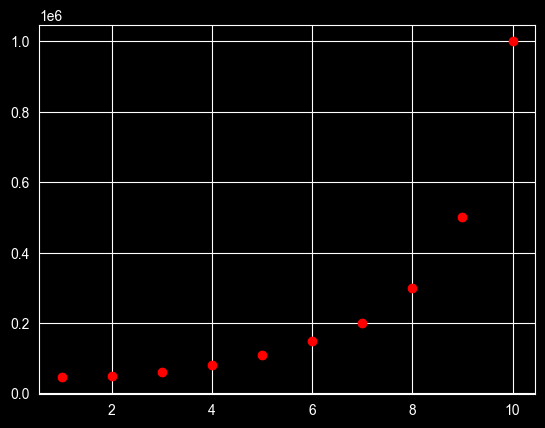

In [12]:
plt.scatter(sc_x.inverse_transform(x), sc_y.inverse_transform(y.reshape(-1,1)), color="red")
plt.show()

Training the Model

In [13]:
model=SVR(kernel='rbf')
model.fit(x,y)

,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm.If none is given, 'rbf' will be used. If a callable is given it isused to precompute the kernel matrix.For an intuitive visualization of different kernel typessee :ref:`sphx_glr_auto_examples_svm_plot_svm_regression.py`",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive.The penalty is a squared l2. For an intuitive visualization of theeffects of scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"epsilon epsilon: float, default=0.1Epsilon in the epsilon-SVR model. It specifies the epsilon-tubewithin which no penalty is associated in the training loss functionwith points predicted within a distance epsilon from the actualvalue. Must be non-negative.",0.1
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False
,"max_iter max_iter: int, default=-1Hard limit on iterations within solver, or -1 for no limit.",-1


Graph

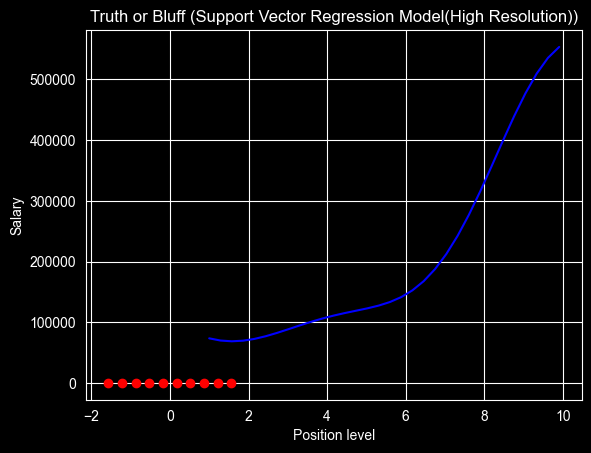

In [14]:
x_grid = np.arange(x.min(), x.max(), 0.1)
x_grid = x_grid.reshape((len(x_grid), 1))

plt.scatter(x, y, color="red")
plt.plot(
    sc_x.inverse_transform(x_grid),
    sc_y.inverse_transform(model.predict(x_grid).reshape(-1,1)),
    color="blue"
)

plt.title("Truth or Bluff (Support Vector Regression Model(High Resolution))")
plt.xlabel("Position level")
plt.ylabel("Salary")
plt.show()

Prediction

In [79]:
y_pred = sc_y.inverse_transform(
    model.predict(sc_x.transform([[10]])).reshape(-1,1)
)

print("Actual Prediction:", y_pred[0][0])

Actual Prediction: 1431410.098263183


Decision Tree?

English:
A Decision Tree is a supervised machine learning algorithm used for both classification and regression.
It works like a tree where each node represents a decision based on a condition.

Bangla:
Decision Tree হলো একটি supervised ML algorithm যা classification এবং regression দুটোতেই ব্যবহার হয়।
এটি একটি গাছের মতো কাজ করে, যেখানে প্রতিটি node একটি decision নেয়।

Why we use Decision Tree?

English:

Very easy to understand
No need for feature scaling
Works with both numeric & categorical data
Can handle non-linear relationships

Bangla:

বুঝতে অনেক সহজ
scaling দরকার হয় না
number এবং category দুইটাই handle করে
nonlinear data তেও কাজ করে
⚙️ How it Works?

English (Simple):

Select the best feature to split data
Divide data based on condition (e.g., Age < 30)
Repeat until reaching final nodes (leaf nodes)
Leaf node gives final prediction

Bangla (সহজভাবে):

সবচেয়ে ভালো feature select করা হয়
condition দিয়ে data ভাগ করা হয়
বারবার split করা হয়
শেষে leaf node থেকে result পাওয়া যায়

📌 Key Terms

Root Node → starting point
Decision Node → split point
Leaf Node → final output
Overfitting → বেশি deep হলে problem

In [36]:
from sklearn.tree import DecisionTreeRegressor   # import decision tree regressor
import numpy as np                               # import numpy

X = np.array([[1], [2], [3], [4], [5]])          # input feature
y = np.array([2, 4, 6, 8, 10])                   # target values

model = DecisionTreeRegressor()   # create model
model.fit(X, y)                   # train model

prediction = model.predict([[6]])  # predict new value
print(prediction)                  # print result

[10.]


Get Started with Decision Tree

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
import math
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

DataFrame

In [37]:
dataset=pd.read_csv("DTR/Position_Salaries.csv")
dataset.head()

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000


In [38]:
x=dataset.iloc[:,1:2].values
y=dataset.iloc[:,2:3].values

x=np.array(x).reshape(-1,1)
y=np.array(y).reshape(-1,1)

Splitting the Dataset into the Training Set and Test Set

In [49]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

PreProcessing

In [51]:
sc_x=StandardScaler()
x_train=sc_x.fit_transform(x_train)
x_test=sc_x.transform(x_test)
sc_y=StandardScaler()
y_train=sc_y.fit_transform(y_train)

Model Train

In [50]:
modelDT=DecisionTreeRegressor(random_state=0)
modelDT.fit(x_train, y_train)

,"criterion criterion: {""squared_error"", ""friedman_mse"", ""absolute_error"", ""poisson""}, default=""squared_error""The function to measure the quality of a split. Supported criteriaare ""squared_error"" for the mean squared error, which is equal tovariance reduction as feature selection criterion and minimizes the L2loss using the mean of each terminal node, ""friedman_mse"", which usesmean squared error with Friedman's improvement score for potentialsplits, ""absolute_error"" for the mean absolute error, which minimizesthe L1 loss using the median of each terminal node, and ""poisson"" whichuses reduction in the half mean Poisson deviance to find splits... versionadded:: 0.18 Mean Absolute Error (MAE) criterion... versionadded:: 0.24 Poisson deviance criterion.",'squared_error'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.For an example of how ``max_depth`` influences the model, see:ref:`sphx_glr_auto_examples_tree_plot_tree_regression.py`.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",None
,"random_state random_state: int, RandomState instance or None, default=NoneControls the randomness of the estimator. The features are alwaysrandomly permuted at each split, even if ``splitter`` is set to``""best""``. When ``max_features < n_features``, the algorithm willselect ``max_features`` at random at each split before finding the bestsplit among them. But the best found split may vary across differentruns, even if ``max_features=n_features``. That is the case, if theimprovement of the criterion is identical for several splits and onesplit has to be selected at random. To obtain a deterministic behaviourduring fitting, ``random_state`` has to be fixed to an integer.See :term:`Glossary ` for details.",0
,"max_le

Tree

[Text(0.7083333333333334, 0.9166666666666666, 'x[0] <= 9.0\nsquared_error = 88437109375.0\nsamples = 8\nvalue = 241875.0'),
 Text(0.625, 0.75, 'x[0] <= 6.5\nsquared_error = 7233673469.388\nsamples = 7\nvalue = 133571.429'),
 Text(0.6666666666666667, 0.8333333333333333, 'True  '),
 Text(0.4166666666666667, 0.5833333333333334, 'x[0] <= 4.5\nsquared_error = 1536000000.0\nsamples = 5\nvalue = 87000.0'),
 Text(0.25, 0.4166666666666667, 'x[0] <= 3.0\nsquared_error = 238888888.889\nsamples = 3\nvalue = 58333.333'),
 Text(0.16666666666666666, 0.25, 'x[0] <= 1.5\nsquared_error = 6250000.0\nsamples = 2\nvalue = 47500.0'),
 Text(0.08333333333333333, 0.08333333333333333, 'squared_error = 0.0\nsamples = 1\nvalue = 45000.0'),
 Text(0.25, 0.08333333333333333, 'squared_error = 0.0\nsamples = 1\nvalue = 50000.0'),
 Text(0.3333333333333333, 0.25, 'squared_error = 0.0\nsamples = 1\nvalue = 80000.0'),
 Text(0.5833333333333334, 0.4166666666666667, 'x[0] <= 5.5\nsquared_error = 400000000.0\nsamples = 2\nval

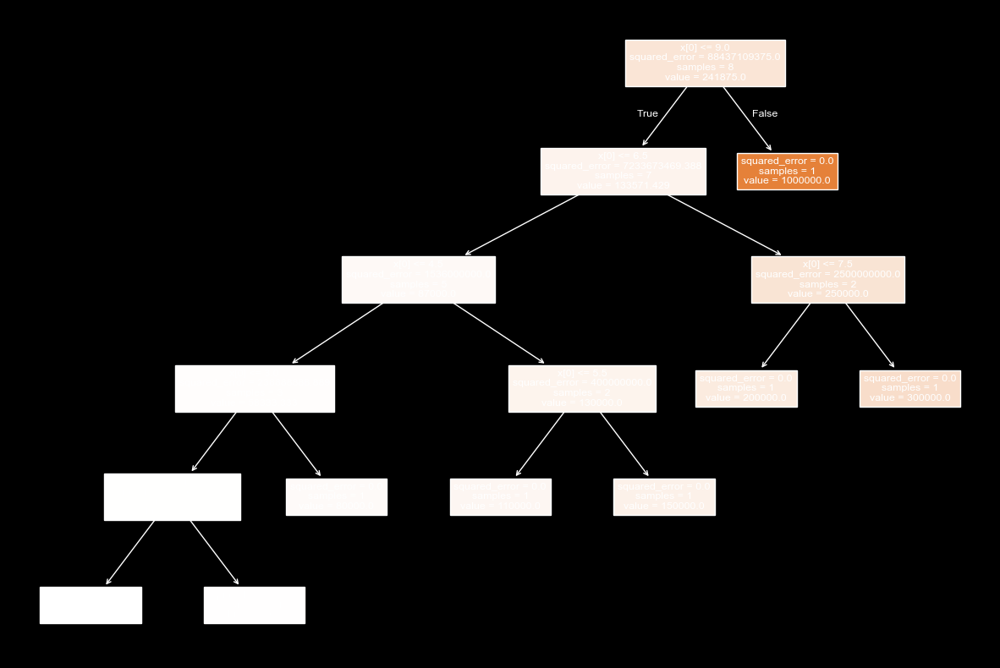

In [55]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(modelDT,filled=True)

Prediction

In [72]:
y_pred = modelDT.predict([[15]])
y_pred

array([1000000.])

MSE

In [77]:
regression_model_mse = mean_squared_error(y_test,modelDT.predict(x_test))
print('Mean Squared Error:\t',math.sqrt(regression_model_mse))
print("R squared value:\t",modelDT.score(x,y))

Mean Squared Error:	 321908.37205639743
R squared value:	 0.9502865342833854


Visualization

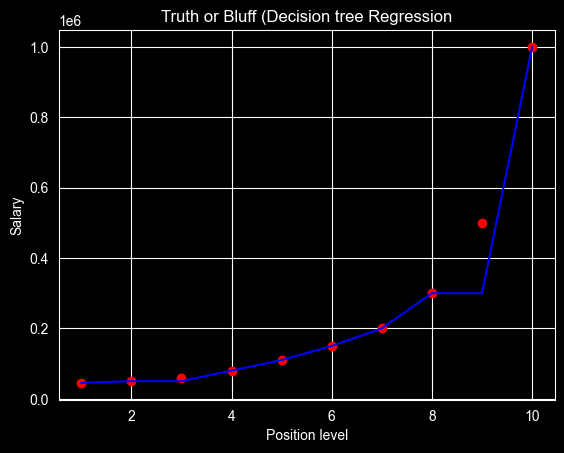

In [76]:
plt.scatter(x,y, color = 'red')
plt.plot(x, modelDT.predict(x), color = 'blue')
plt.title('Truth or Bluff (Decision tree Regression')
plt.xlabel('Position level')
plt.ylabel('Salary')
plt.show()

Random Forest Regression

📌 What is Random Forest Regression?

English:
Random Forest Regression is an advanced ML algorithm based on multiple Decision Tree models.It builds many trees and combines their outputs to make a better prediction.

Bangla:
Random Forest Regression হলো অনেকগুলো Decision Tree একসাথে ব্যবহার করে prediction করার একটি method। এটা অনেকগুলো tree তৈরি করে এবং তাদের result combine করে final output দেয়।

Why we use Random Forest?

English:

Reduces overfitting (compared to single tree)
More accurate
Works well on large datasets
Handles non-linear data

Bangla:

overfitting কম হয়
বেশি accurate
বড় dataset এ ভালো কাজ করে
nonlinear data handle করতে পারে
⚙️ How it Works?

English (Simple):

Creates many Decision Trees
Each tree gets random data (bagging)
Each tree predicts
Final output = average of all trees

Bangla (সহজভাবে):

অনেকগুলো Decision Tree তৈরি করে
প্রতিটা tree আলাদা data পায়
সব tree prediction দেয়
average নিয়ে final result দেয়

📌 Key Concepts

Ensemble Learning → multiple model use করা
Bagging → random data sampling
n_estimators → number of trees

In [83]:
from sklearn.ensemble import RandomForestRegressor   # import model
import numpy as np                                   # numerical operations

X = np.array([[1], [2], [3], [4], [5]])              # input data
y = np.array([2, 4, 6, 8, 10])                       # target values

model = RandomForestRegressor(n_estimators=100)  # create model with 100 trees
model.fit(X, y)                                 # train model

prediction = model.predict([[6]])               # predict new value
print(prediction)                               # print result

[9.3]


Get Started with Random Forest Regression

In [84]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

Importing the Dataset

In [85]:
dataset = pd.read_csv("DTR/Position_Salaries.csv")
print(dataset.head())
X = dataset["Level"].values
y = dataset["Salary"].values

X= np.array(X).reshape(-1,1)
y= np.array(y).reshape(-1,1)

            Position  Level  Salary
0   Business Analyst      1   45000
1  Junior Consultant      2   50000
2  Senior Consultant      3   60000
3            Manager      4   80000
4    Country Manager      5  110000


Splitting the Dataset into the Training Set and Test Set

In [86]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

Feature Scaling

In [89]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)
sc_y = StandardScaler()
y_train = sc_y.fit_transform(y_train)

Training the Model

In [90]:
modelRF = RandomForestRegressor(random_state = 0)
modelRF.fit(X,y)

C:\Users\naimul.islam\PyCharmMiscProject\.venv\Lib\site-packages\sklearn\base.py:1336: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""squared_error"", ""absolute_error"", ""friedman_mse"", ""poisson""}, default=""squared_error""The function to measure the quality of a split. Supported criteriaare ""squared_error"" for the mean squared error, which is equal tovariance reduction as feature selection criterion and minimizes the L2loss using the mean of each terminal node, ""friedman_mse"", which usesmean squared error with Friedman's improvement score for potentialsplits, ""absolute_error"" for the mean absolute error, which minimizesthe L1 loss using the median of each terminal node, and ""poisson"" whichuses reduction in Poisson deviance to find splits.Training using ""absolute_error"" is significantly slowerthan when using ""squared_error""... versionadded:: 0.18 Mean Absolute Error (MAE) criterion... versionadded:: 1.0 Poisson criterion.",'squared_error'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=1.0The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None or 1.0, then `max_features=n_features`... note:: The default of 1.0 is equivalent to bagged trees and more randomness can be achieved by setting smaller values, e.g. 0.3... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to 1.0.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",1.0
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsample

In [91]:
dataset.Level
# dataset.Salary

0     1
1     2
2     3
3     4
4     5
5     6
6     7
7     8
8     9
9    10
Name: Level, dtype: int64

Tree Visualization

In [92]:
len(modelRF.estimators_)

100

C:\Users\naimul.islam\AppData\Local\Temp\ipykernel_5956\577535665.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,10))


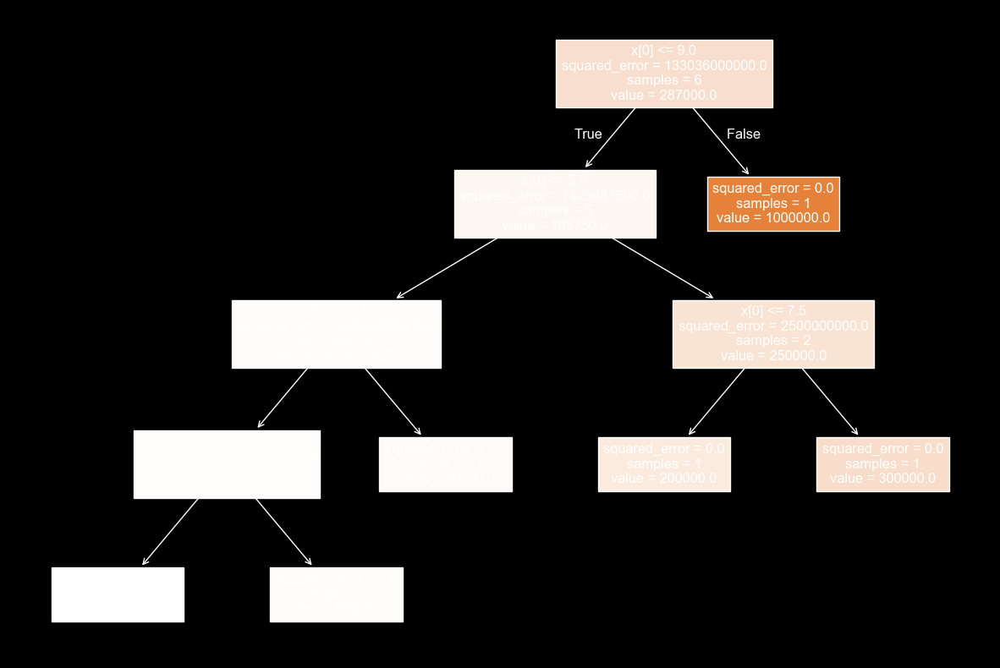

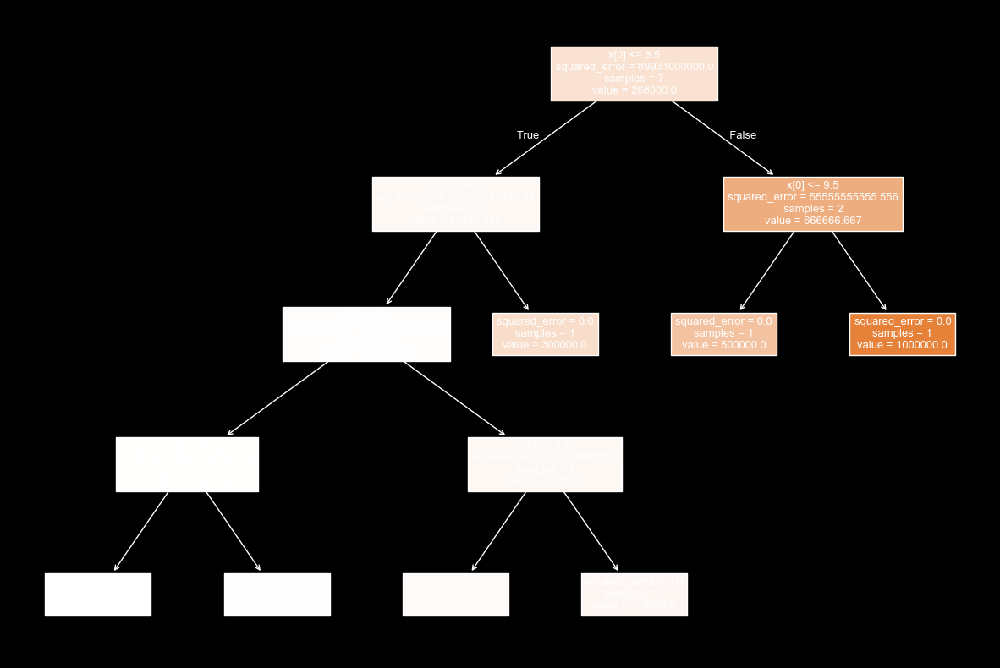

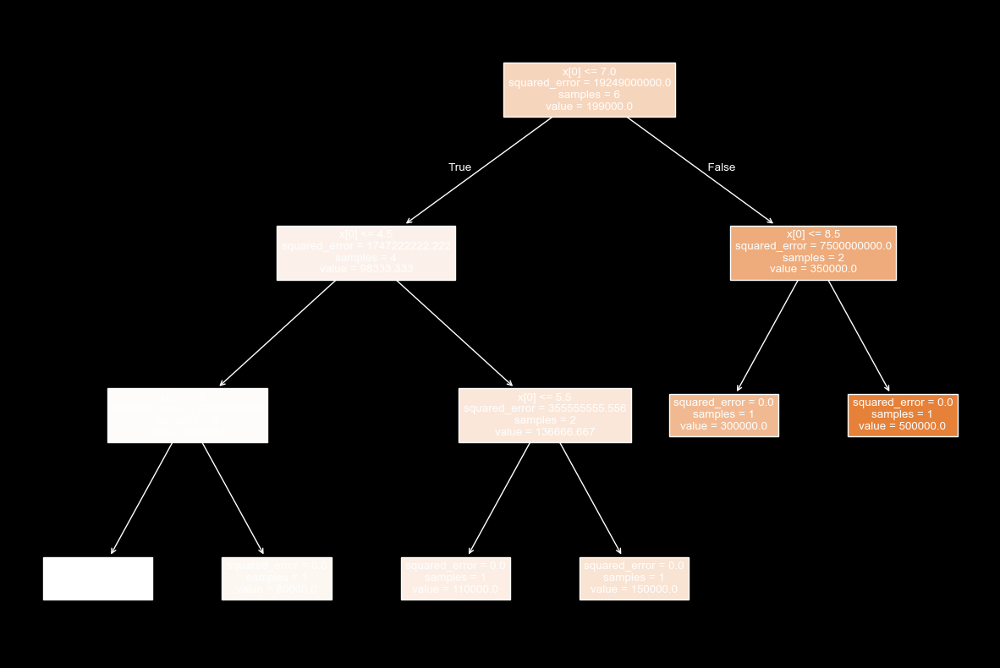

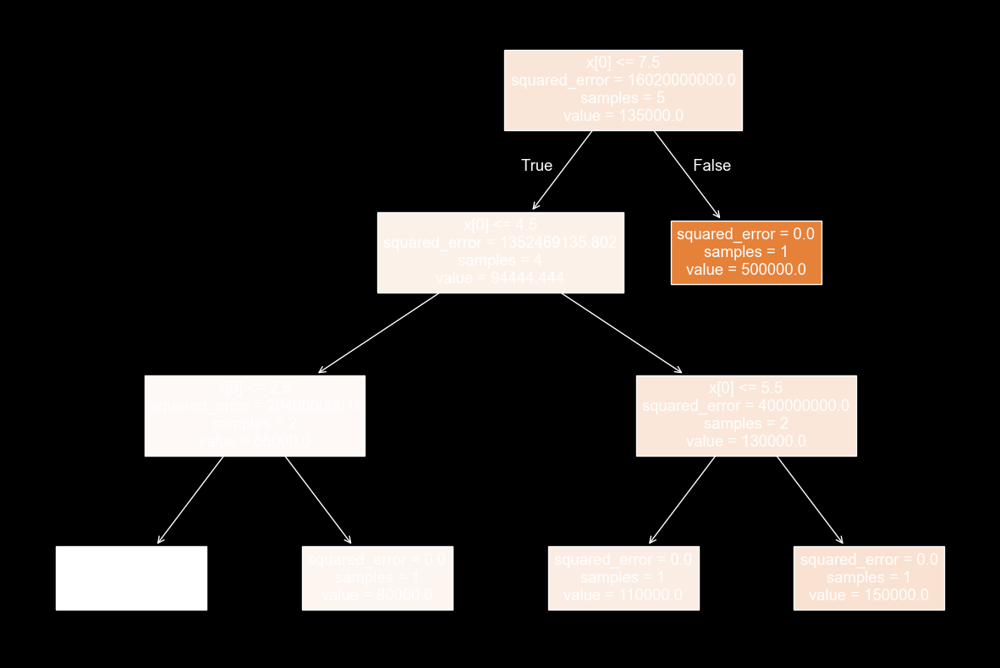

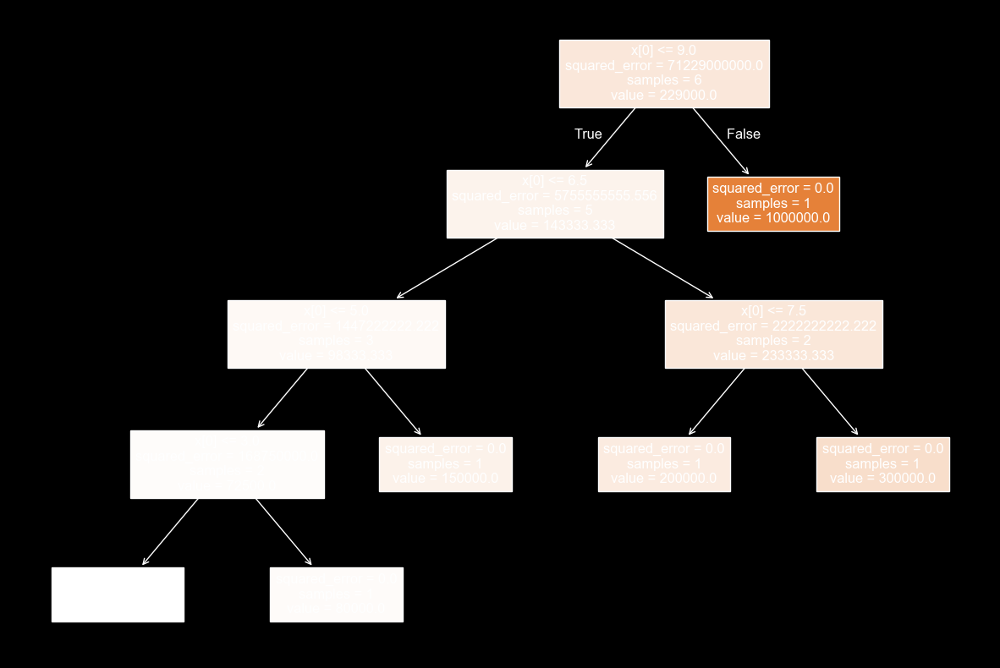

...

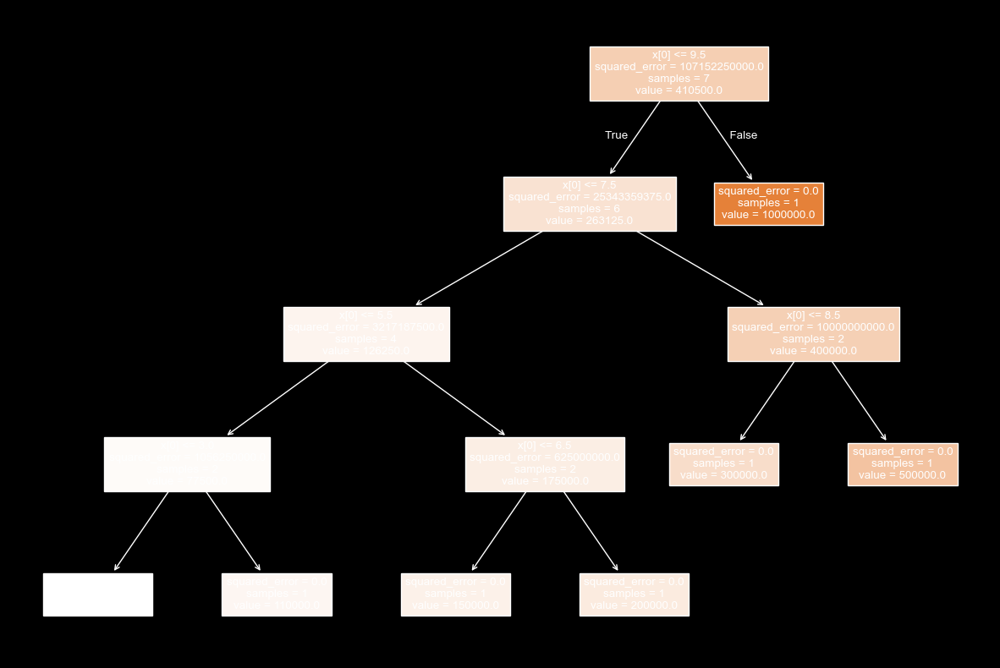

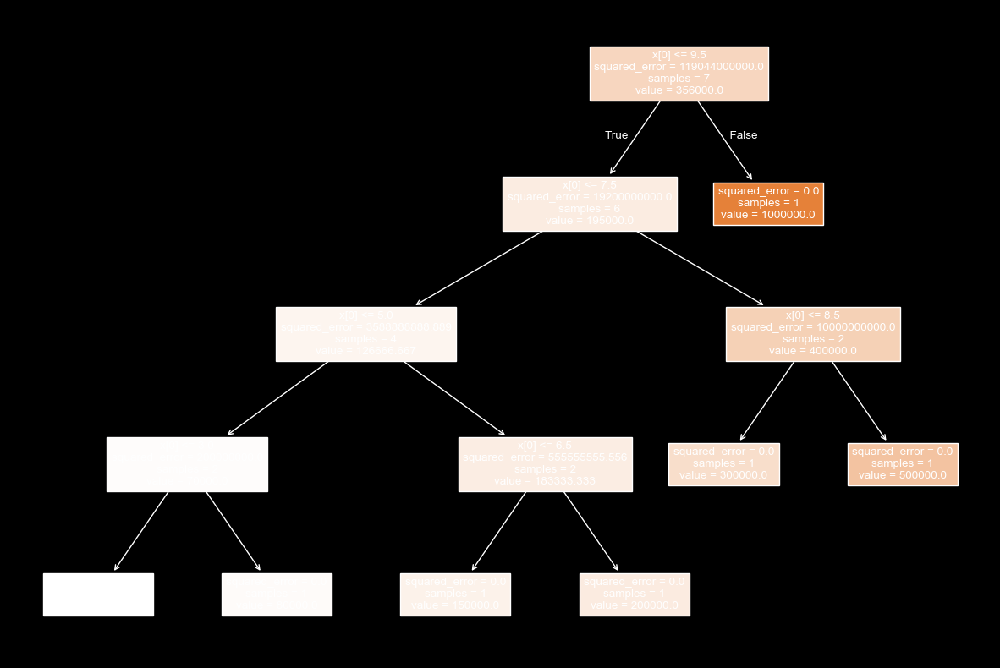

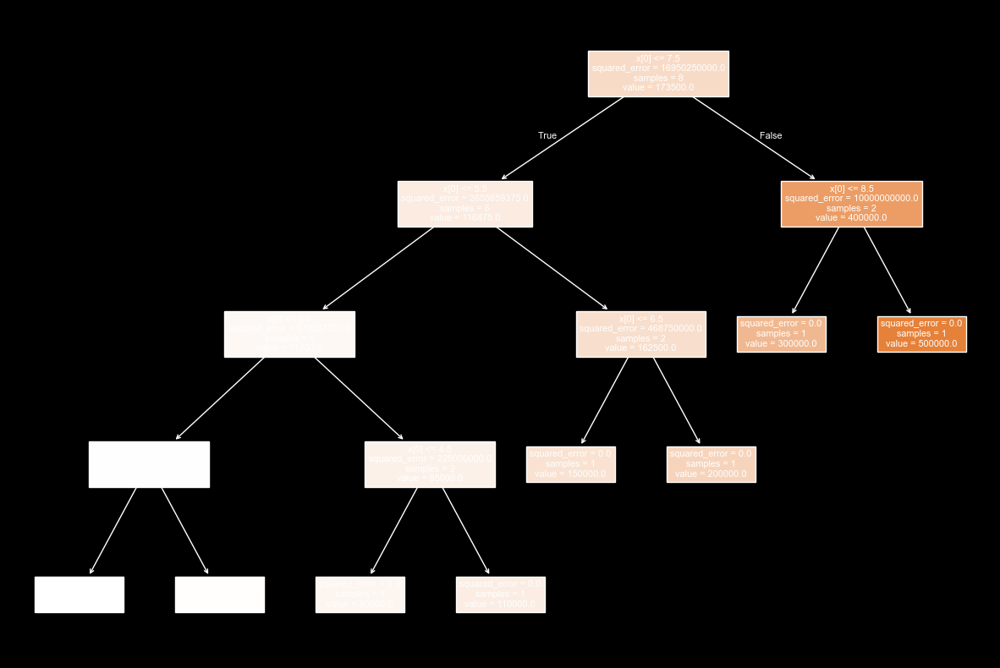

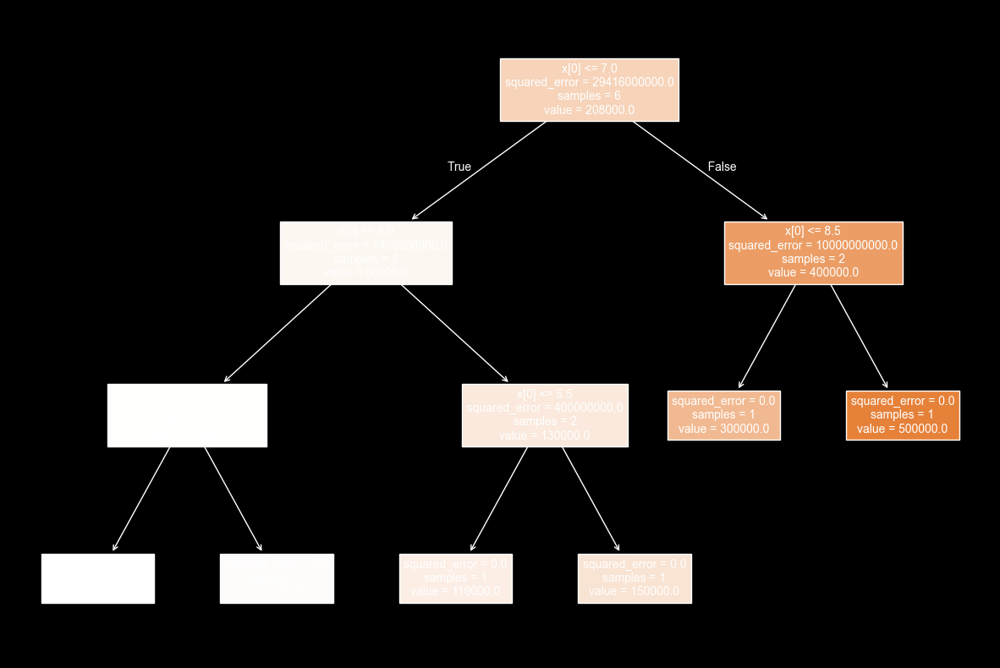

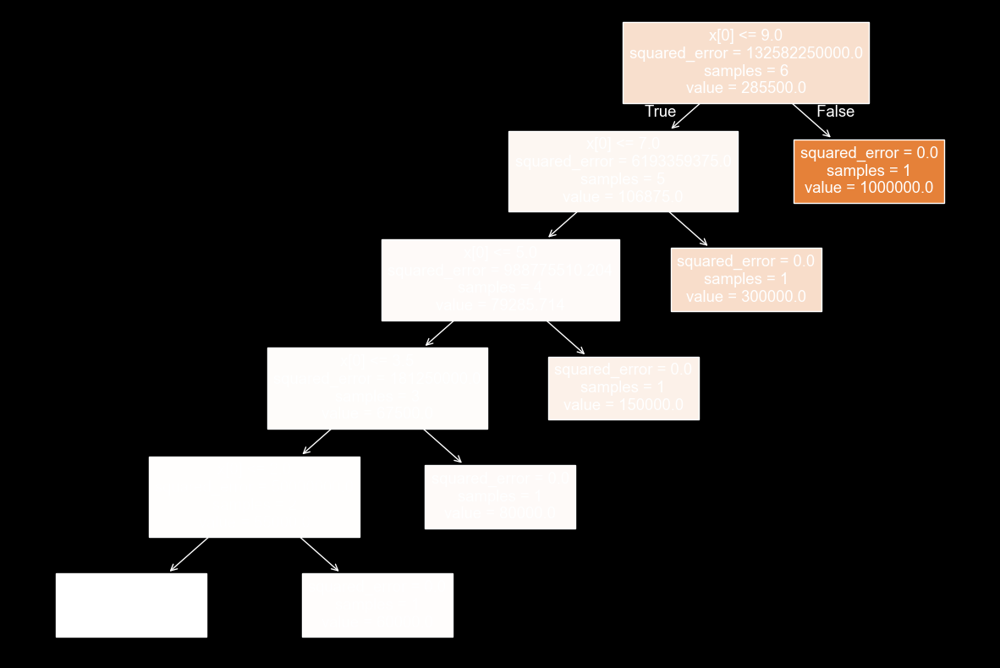

In [93]:
for i in range(0,100):
  plt.figure(figsize=(15,10))
  tree.plot_tree(modelRF.estimators_[i],filled=True)

In [94]:
y_pred = modelRF.predict([[6.5]])
y_pred


array([158300.])

Mean Squared Error

In [95]:

from sklearn.metrics import mean_squared_error
import math

regression_model_mse = mean_squared_error(y_test,modelRF.predict(X_test))
print('Mean Squared Error:\t',math.sqrt(regression_model_mse))
print("R squared value\t\t",modelRF.score(X,y))

Mean Squared Error:	 319833.74196604086
R squared value		 0.9378393331453065


Visualization

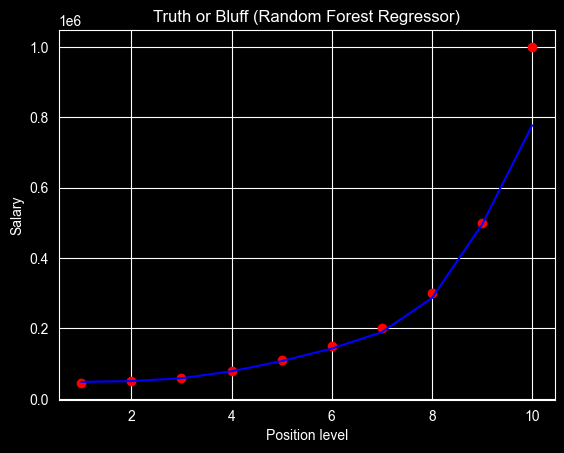

In [96]:

plt.scatter(X,y, color = 'red')
plt.plot(X, modelRF.predict(X), color = 'blue')
plt.title('Truth or Bluff (Random Forest Regressor)')
plt.xlabel('Position level')
plt.ylabel('Salary')
plt.show()
